In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px

In [2]:
pd.DataFrame.iteritems = pd.DataFrame.items

In [3]:
# Retrieve dataset and read first 5 rows
macroNutrient_removeRow =pd.read_csv(r"../Dataset/Dataset for EDA/macroNutrient_removeRow.csv", encoding= 'unicode_escape')
macroNutrient_removeRow

,No.,Description,Category,Energy (Kcal),Carbohydrate(g),Protein(g),Total Lipid(g),Monounsaturated Fatty Acids(g),Polyunsaturated Fatty Acids(g),Saturated Fatty Acids(g)
0,15155,"ABALONE,MIXED SPECIES,RAW",ABALONE,105,6.01,17.10,0.76,0.107,0.104,0.149
1,15156,"ABALONE,MXD SP,CKD,FRIED",ABALONE,189,11.05,19.63,6.78,2.741,1.676,1.646
2,9002,"ACEROLA JUICE,RAW",ACEROLA JUICE,23,4.80,0.40,0.30,0.082,0.090,0.068
3,9001,"ACEROLA,(WEST INDIAN CHERRY),RAW",ACEROLA,32,7.69,0.40,0.30,0.082,0.090,0.068
4,12060,"ACORN FLOUR,FULL FAT",ACORN FLOUR,501,54.65,7.49,30.17,19.110,5.813,3.923
...,...,...,...,...,...,...,...,...,...,...
8110,1119,"YOGURT,VANILLA,LOFAT,11 GRAMS PROT PER 8 OZ",YOGURT,85,13.80,4.93,1.25,0.343,0.036,0.806
8111,1220,"YOGURT,VANILLA,LOFAT,11 GRAMS PROT PER 8 OZ,FO...",YOGURT,85,13.80,4.93,1.25,0.343,0.036,0.806
8112,1295,"YOGURT,VANILLA,NON-FAT",YOGURT,78,17.04,2.94,0.00,0.000,0.000,0.000
8113,16004,"YOKAN,PREP FROM ADZUKI BNS & SUGAR",YOKAN,260,60.72,3.29,0.12,0.011,0.026,0.043


In [4]:
# display information of the dataset
macroNutrient_removeRow.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8115 entries, 0 to 8114
Data columns (total 10 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   No.                             8115 non-null   int64  
 1   Description                     8115 non-null   object 
 2   Category                        8115 non-null   object 
 3   Energy (Kcal)                   8115 non-null   int64  
 4   Carbohydrate(g)                 8115 non-null   float64
 5   Protein(g)                      8115 non-null   float64
 6   Total Lipid(g)                  8115 non-null   float64
 7   Monounsaturated Fatty Acids(g)  8115 non-null   float64
 8   Polyunsaturated Fatty Acids(g)  8115 non-null   float64
 9   Saturated Fatty Acids(g)        8115 non-null   float64
dtypes: float64(6), int64(2), object(2)
memory usage: 634.1+ KB


In [5]:
# convert datatype for number to string
macroNutrient_removeRow['No.'] = macroNutrient_removeRow['No.'].astype('str')

In [6]:
# display information of the dataset
macroNutrient_removeRow.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8115 entries, 0 to 8114
Data columns (total 10 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   No.                             8115 non-null   object 
 1   Description                     8115 non-null   object 
 2   Category                        8115 non-null   object 
 3   Energy (Kcal)                   8115 non-null   int64  
 4   Carbohydrate(g)                 8115 non-null   float64
 5   Protein(g)                      8115 non-null   float64
 6   Total Lipid(g)                  8115 non-null   float64
 7   Monounsaturated Fatty Acids(g)  8115 non-null   float64
 8   Polyunsaturated Fatty Acids(g)  8115 non-null   float64
 9   Saturated Fatty Acids(g)        8115 non-null   float64
dtypes: float64(6), int64(1), object(3)
memory usage: 634.1+ KB


In [7]:
# list the macronutrients in a variable called col_name
col_name = macroNutrient_removeRow.columns[3:11]
col_name

Index(['Energy (Kcal)', 'Carbohydrate(g)', 'Protein(g)', 'Total Lipid(g)',
       'Monounsaturated Fatty Acids(g)', 'Polyunsaturated Fatty Acids(g)',
       'Saturated Fatty Acids(g)'],
      dtype='object')

In [8]:
# drop the number
macroNutrient_removeRow.drop(macroNutrient_removeRow.columns[[0,1]],axis=1)

,Category,Energy (Kcal),Carbohydrate(g),Protein(g),Total Lipid(g),Monounsaturated Fatty Acids(g),Polyunsaturated Fatty Acids(g),Saturated Fatty Acids(g)
0,ABALONE,105,6.01,17.10,0.76,0.107,0.104,0.149
1,ABALONE,189,11.05,19.63,6.78,2.741,1.676,1.646
2,ACEROLA JUICE,23,4.80,0.40,0.30,0.082,0.090,0.068
3,ACEROLA,32,7.69,0.40,0.30,0.082,0.090,0.068
4,ACORN FLOUR,501,54.65,7.49,30.17,19.110,5.813,3.923
...,...,...,...,...,...,...,...,...
8110,YOGURT,85,13.80,4.93,1.25,0.343,0.036,0.806
8111,YOGURT,85,13.80,4.93,1.25,0.343,0.036,0.806
8112,YOGURT,78,17.04,2.94,0.00,0.000,0.000,0.000
8113,YOKAN,260,60.72,3.29,0.12,0.011,0.026,0.043


### Exploratory Data Analysis

#### 1. Using heatmap to observe the correlation of the data

- Which pair of data has high correlation?
- Which pair of data has moderate correlation?
- Which pair of data has low correlation?

In [9]:
macroNutrient_removeRow_c1 = macroNutrient_removeRow.drop(macroNutrient_removeRow.columns[[0,1,2]],axis=1)
macroNutrient_removeRow_corr = macroNutrient_removeRow_c1.corr()


<Axes: >

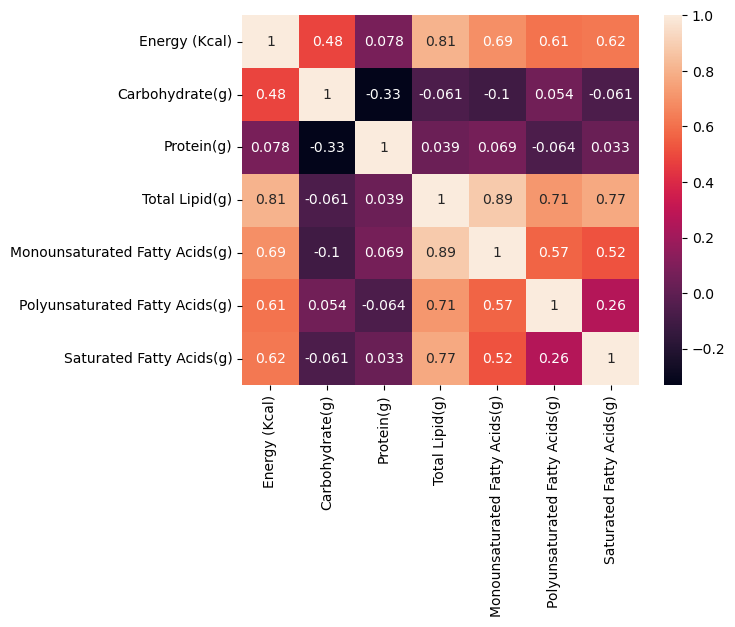

In [10]:
sns.heatmap(macroNutrient_removeRow_corr, annot=True)

In [11]:
# rank the correlation of the features

upper_corr_mat = macroNutrient_removeRow_corr.where(
    np.triu(np.ones(macroNutrient_removeRow_corr.shape),k=1).astype('bool')
)
upper_corr_pairs = upper_corr_mat.unstack().dropna()

corr_ranking = pd.DataFrame(upper_corr_pairs.sort_values(ascending=False), columns = ['correlation'])

corr_ranking

correlation
Monounsaturated Fatty Acids(g) Total Lipid(g)                     0.885492
Total Lipid(g)                 Energy (Kcal)                      0.806921
Saturated Fatty Acids(g)       Total Lipid(g)                     0.772199
Polyunsaturated Fatty Acids(g) Total Lipid(g)                     0.714877
Monounsaturated Fatty Acids(g) Energy (Kcal)                      0.691715
Saturated Fatty Acids(g)       Energy (Kcal)                      0.621012
Polyunsaturated Fatty Acids(g) Energy (Kcal)                      0.608085
                               Monounsaturated Fatty Acids(g)     0.566153
Saturated Fatty Acids(g)       Monounsaturated Fatty Acids(g)     0.517470
Carbohydrate(g)                Energy (Kcal)                      0.481935
Saturated Fatty Acids(g)       Polyunsaturated Fatty Acids(g)     0.260192
Protein(g)                     Energy (Kcal)                      0.078213
Monounsaturated Fatty Acids(g) Protein(g)                         0.069206
Polyunsaturated Fatty Acids(g) Carbohydrate(g)                    0.054332
Total Lipid(g)                 Protein(g)                         0.038554
Saturated Fatty Acids(g)       Protein(g)                         0.033381
Total Lipid(g)                 Carbohydrate(g)                   -0.061208
Saturated Fatty Acids(g)       Carbohydrate(g)                   -0.061443
Polyunsaturated Fatty Acids(g) Protein(g)                        -0.063885
Monounsaturated Fatty Acids(g) Carbohydrate(g)                   -0.103921
Protein(g)                     Carbohydrate(g)                   -0.330268

As observed and supported from the heatmap, we can made the conclusions below:


Let's just focus on these few spectrums first
- Pair of Energy and Carbohydrate has a moderate correlation (around 0.5), this indicates that foods rich in carbohydrates bring more energy.
- Pair of Energy and Total Lipid has a high correlation (around 0.9), because lipids include a high percentage of C-H bonds, which store chemical potential energy more effectively than other molecules. Hence, fats contain more energy per gram than carbohydrates.
- Pair of Energy and Protein has a low correlation (around 0.1) , this implies that protein foods bring little energy.



- Pair of Carbohydrate and Protein has a negative correlation (around -0.2), this conveys that carb food has low protein and vice versa.
- Pair of Carbohydrate and Total Lipid observed a negative correlation (around -0.1) , which express that carbs food serves with low fat.

#### 2. Using a violin plot to depict distributions of numeric data

- Does the data contain outliers?
- What does the distribution of data look like?

In [12]:
def create_violin_box(data, feature_name):
    
    values = sorted(data[feature_name])
    violin = px.violin(x=values, box=True, title=f"Violin Plot with box of {feature_name}",width=950,
                      color_discrete_sequence=['lightseagreen'])
    violin.update_layout(
        xaxis_title=f"{feature_name}",
        yaxis_title="Frequency Distribution"
    )
    violin.show()

#     box = px.box(x=values, title=f"Box Plot for {feature_name}", notched=True, width=950)
#     box.update_layout(
#         xaxis_title=f"{feature_name}",
#         yaxis_title="Frequency Distribution"
#     )
#     box.show()

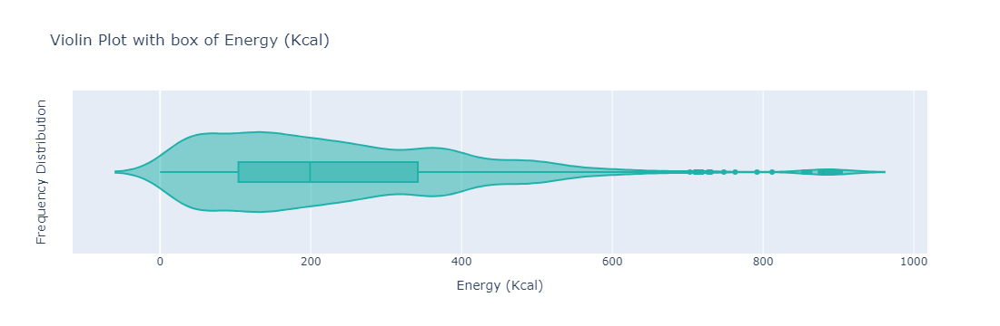

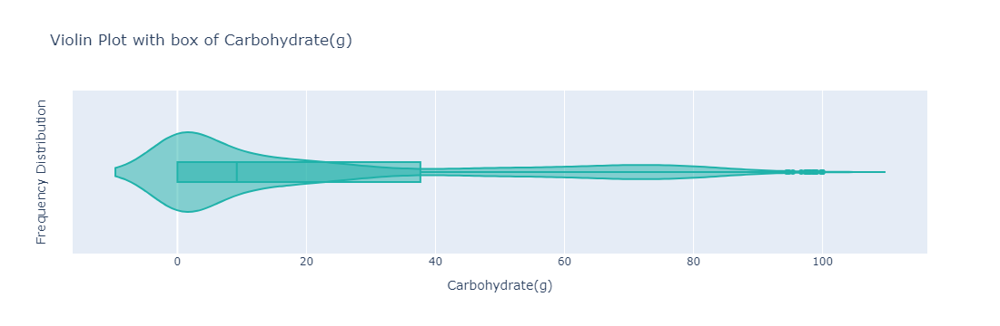

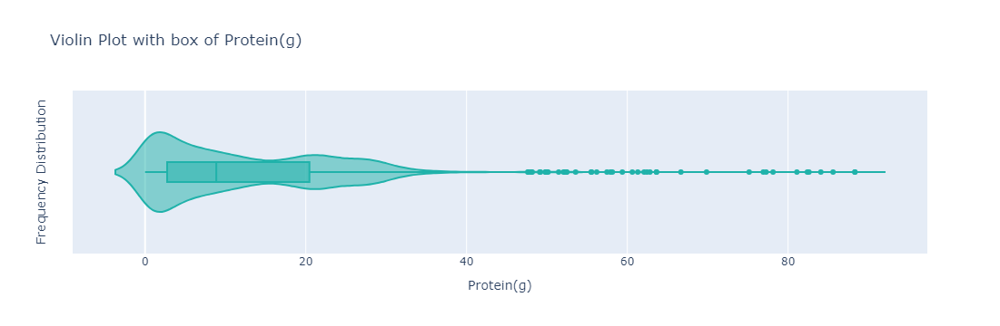

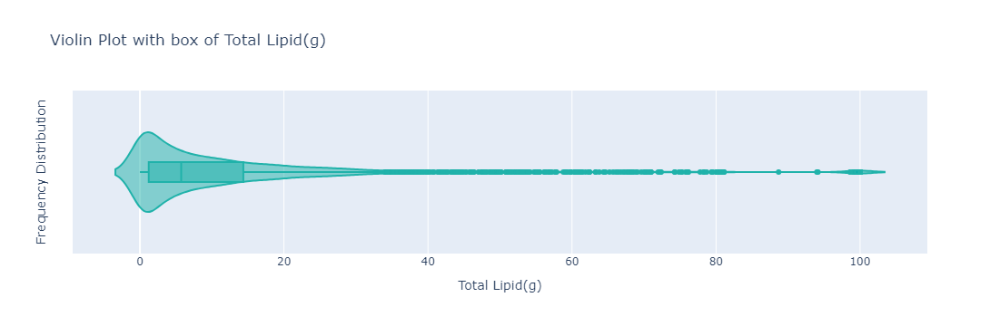

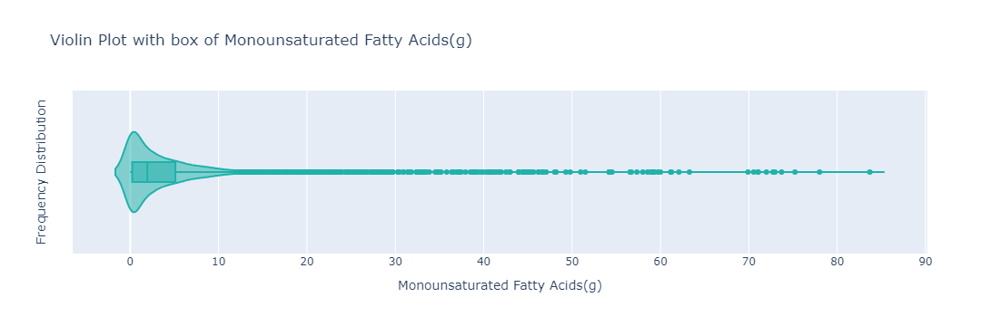

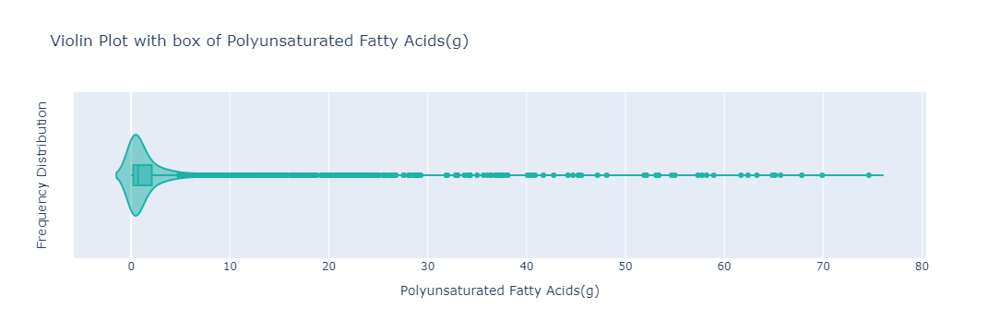

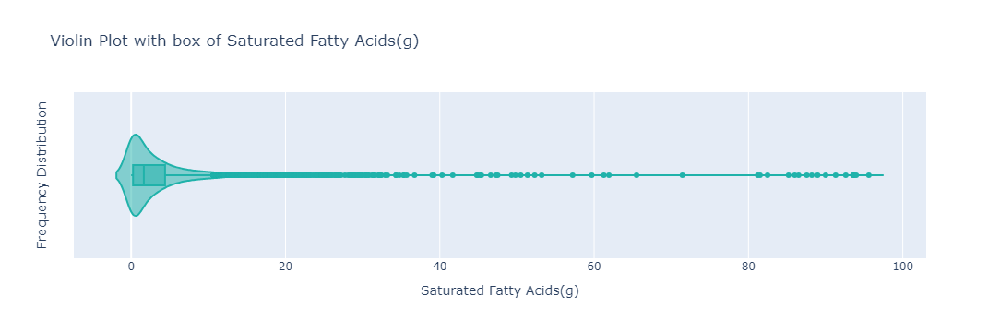

In [13]:
for i in col_name:
    create_violin_box(macroNutrient_removeRow,i)

Trought the violin plot with box, we understand that

- The dataset contains outliers
- Almost all features are positively skewed, which means the most extreme values are on the right side.

#### 3. Using a histogram to observe detailed distrubution of data

- These histograms offer a comprehensive insight into data distribution, effectively capturing outliers, data spread, and frequency distribution within each bin.

In [14]:
def create_hist(data, feature_name):
    # values = sorted(data[feature_name])
    hist = px.histogram(x=data[feature_name], marginal='box',
                        title=f"Histogram of {feature_name}", text_auto=True, nbins=50, width=950,
                       color_discrete_sequence=['lightsteelblue'] )
    hist.update_layout(
        xaxis_title=feature_name,
        yaxis_title="Frequency",
        showlegend=False
    )
    hist.show()

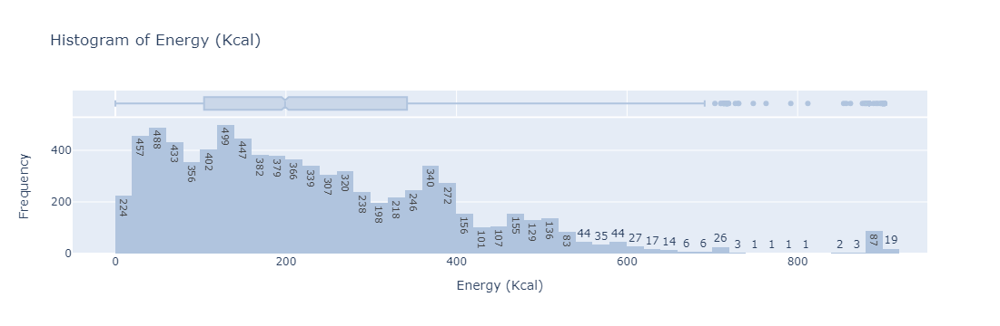

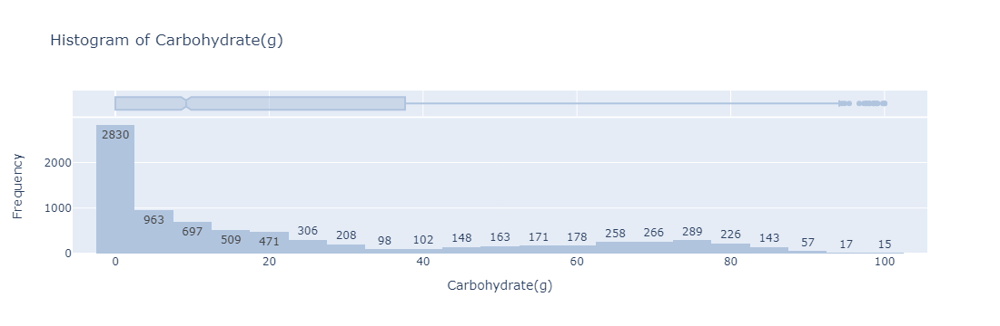

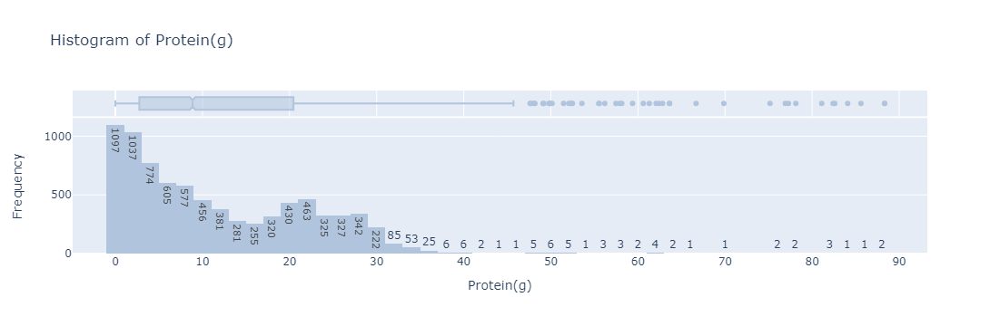

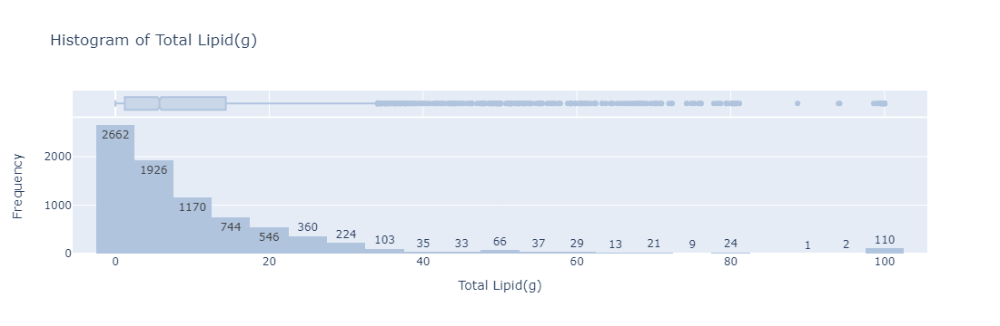

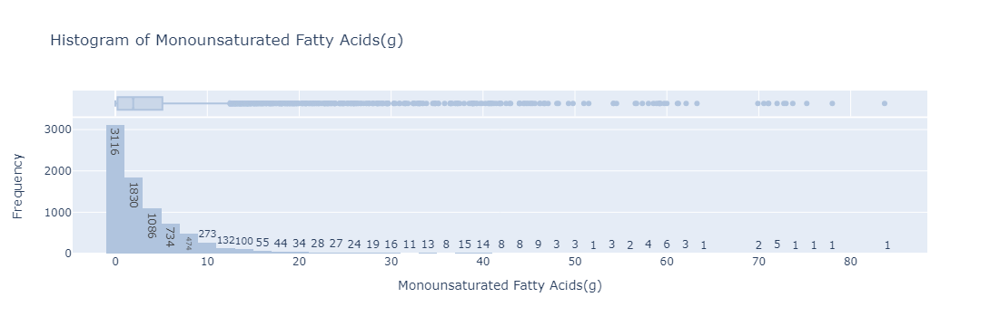

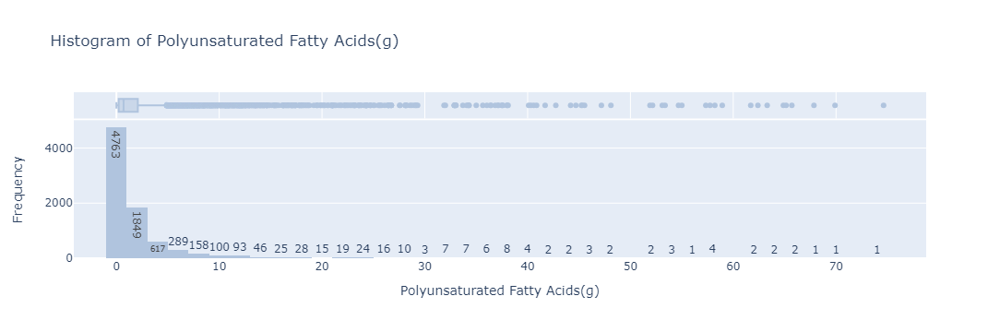

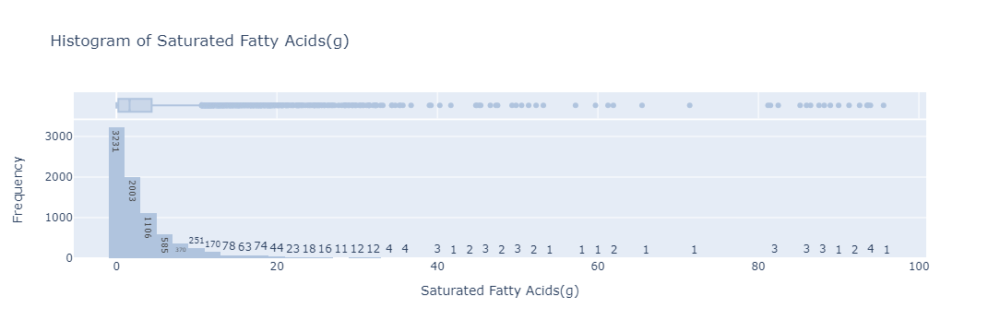

In [15]:
for i in col_name:
    create_hist(macroNutrient_removeRow,i)

Insights here

#### 4. Scatter plot

Previously, we delved into the heatmap, which illustrates data correlations. Similarly, the scatter plot functions akin to the heatmap but provides a better understanding of data variation.

In this section, we tend to explore
- What are the correlationss between each macronutrient and 'Energ_Kcal'?

In [16]:
def create_scatter_plot(x_var, y_var, data, trendline= False):
    scatter_plot = px.scatter(
        data_frame=data, x=x_var, y=y_var,
        trendline="ols" if trendline else None,
        marginal_x="histogram",
        marginal_y="histogram",
        color_discrete_sequence=['lightseagreen'],
        height=700,
        title=f"{x_var} vs {y_var}"
    )
    scatter_plot.update_layout(
        xaxis_title=x_var,
        yaxis_title=y_var,
        title_font_size=16,
        font=dict(family="Arial", size=12)
    )
    scatter_plot.show()

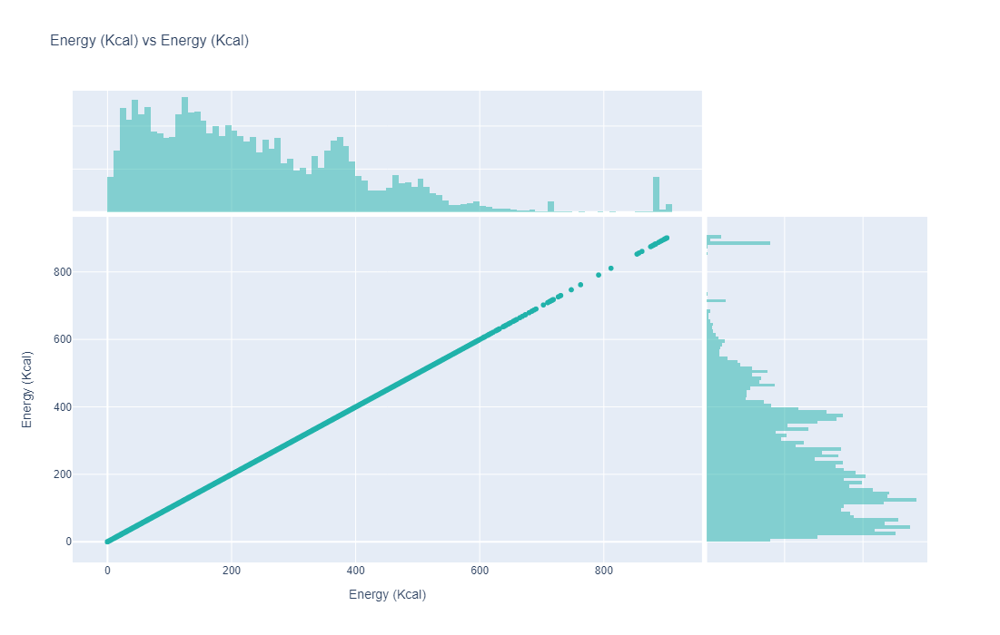

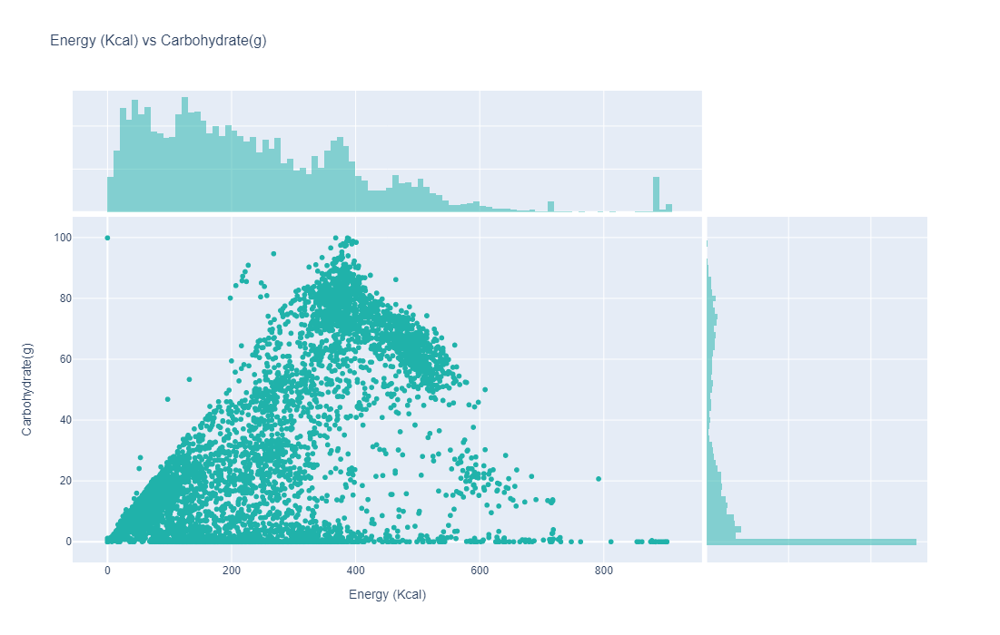

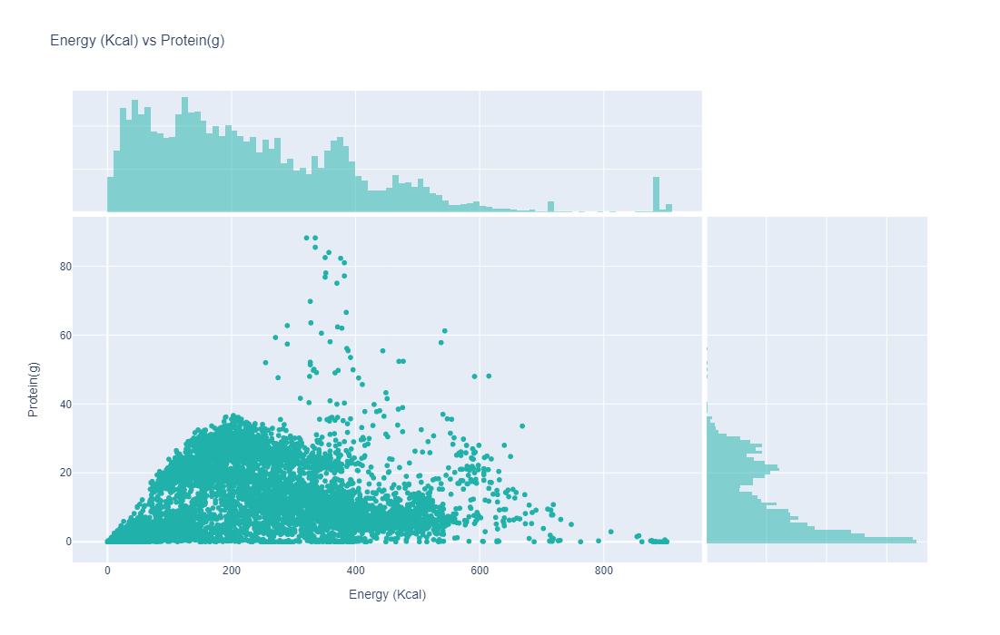

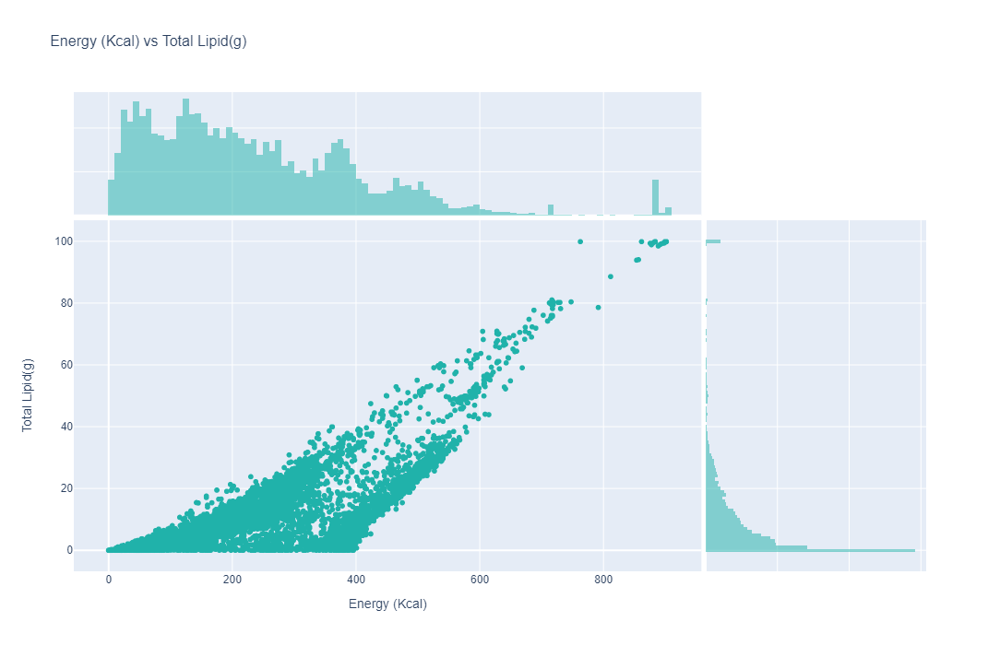

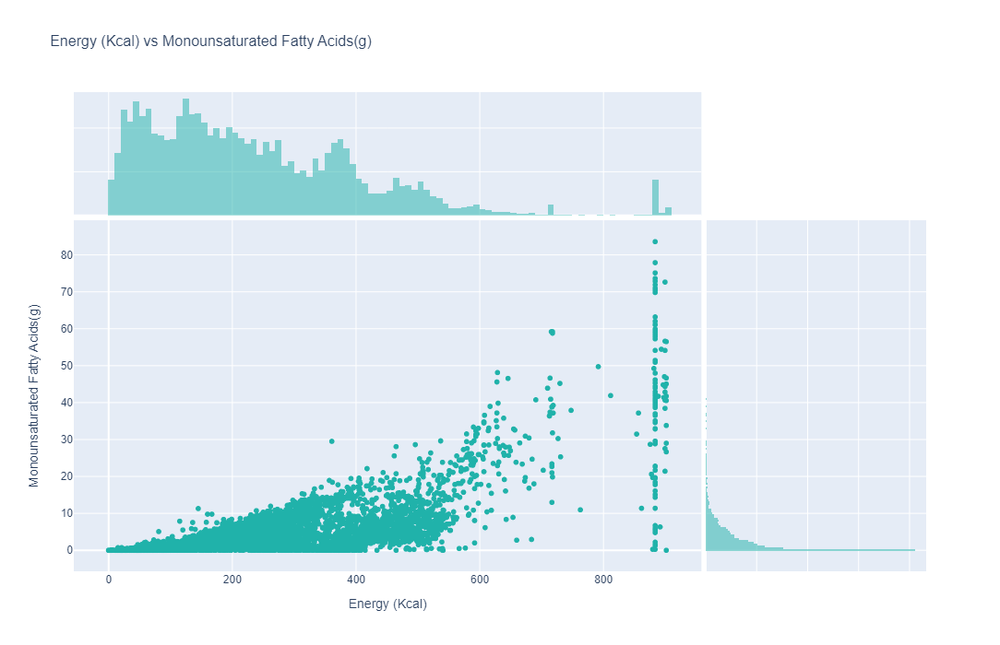

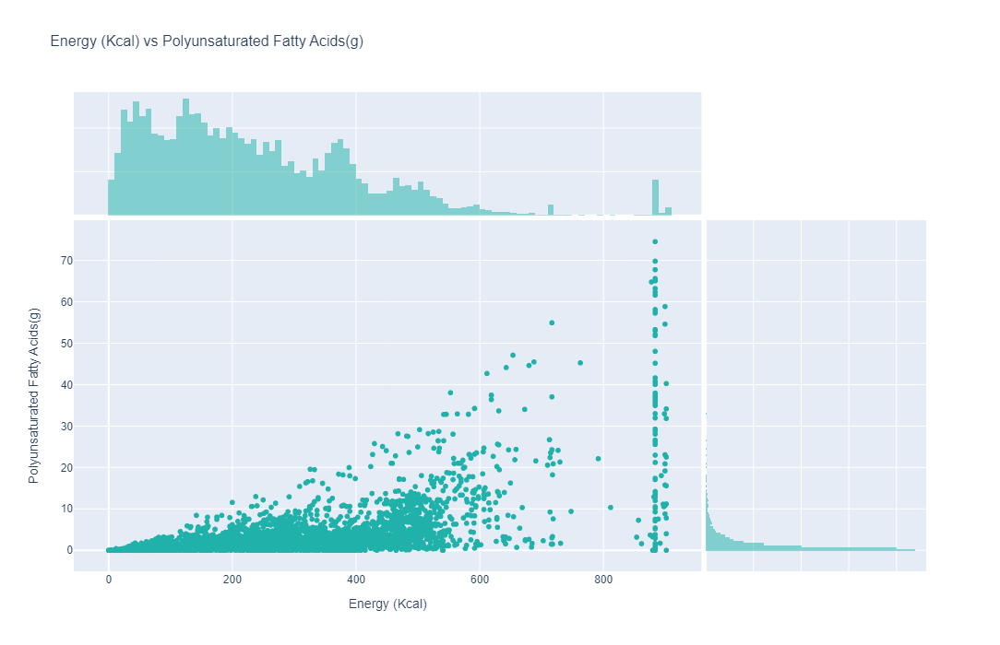

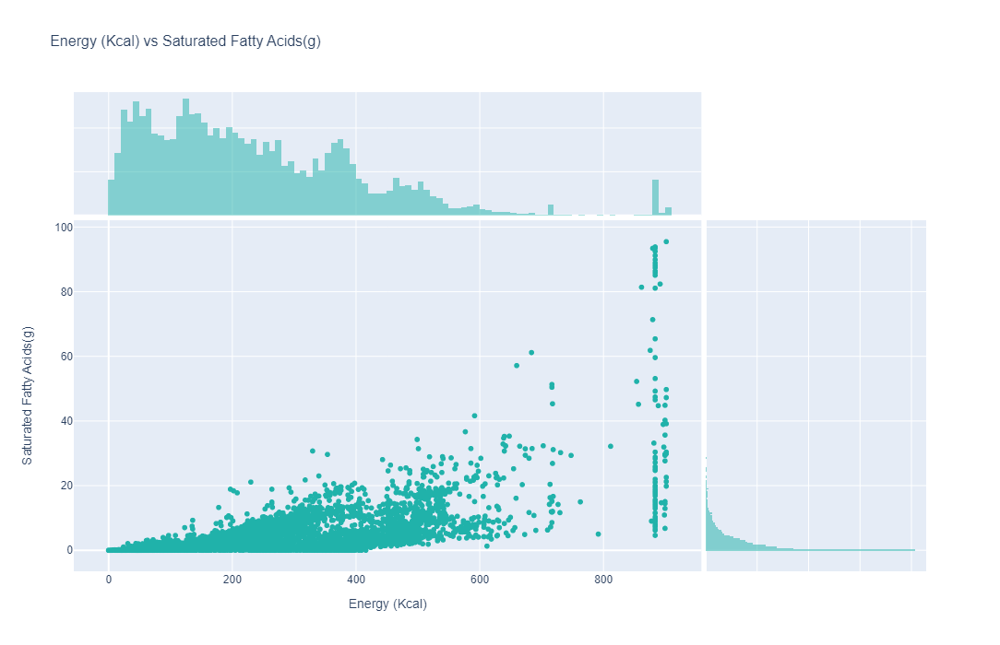

In [17]:
for i in col_name:
    create_scatter_plot('Energy (Kcal)',i,macroNutrient_removeRow)


Through each of the scatter plot, we analysis that
- the higher the energy, the higher the carbohydrate, but after energy reaches around 400 Kcal, the relationship from positive correlation become negative correlation.
- high protein food contributes less calories and vice versa, since higher distribution at low calories range compared to carb food.
- high lipid food is considered as high calories food.
- each type of fatty acid has similar relationship with energy as lipid, and that is logical true from biological perspective, because fatty acid is the component of lipid


#### 5. Text
Now, we try to get the insight from the text of description by using word cloud

In [18]:
# install and import wordcloud and textwrap
!pip install wordcloud

In [19]:
from wordcloud import WordCloud

In [20]:
def generate_wordcloud(data):
  wordcloud = WordCloud(background_color="white").generate(data)
  plt.figure(figsize=(10,8))
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.title('Food Description',fontsize=13)
  plt.show()


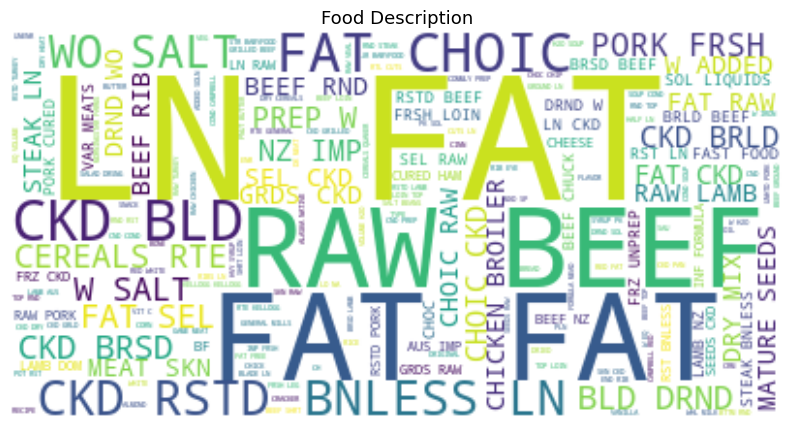

In [21]:
text = " ".join(text for text in macroNutrient_removeRow['Description'])

generate_wordcloud(text)

From the WordCloud, we may notice that there are quick a lot of description having fat. Besides, a higher portion of food may still be in the raw state.

### Analysing categories
In this section, we will shift our focus into each macronutrient explicitly to gain more insights.

First, we explore the calories category with aim to find the top 20 food with high calories
#### 1. Calories

In [22]:
macroNutrient_removeRow_ND = macroNutrient_removeRow.drop(macroNutrient_removeRow[['No.','Description']],axis=1)


In [23]:
calories_ranking = macroNutrient_removeRow_ND.groupby(['Category']).mean().sort_values(by=['Energy (Kcal)'],ascending=False)
calories_ranking.head(20)

,Energy (Kcal),Carbohydrate(g),Protein(g),Total Lipid(g),Monounsaturated Fatty Acids(g),Polyunsaturated Fatty Acids(g),Saturated Fatty Acids(g)
Category,,,,,,,
FISH OIL,902.000000,0.000000,0.000000,100.000000,32.141167,24.088833,36.614833
LARD,902.000000,0.000000,0.000000,100.000000,45.100000,11.200000,39.200000
FAT,897.666667,0.000000,0.000000,99.866667,46.000000,13.283333,36.200000
ANIMAL FAT,897.000000,0.000000,0.000000,99.500000,44.874000,11.144000,39.004000
SHORTENING FRYING (HVY DUTY),892.000000,0.000000,0.000000,100.000000,39.550000,8.150000,46.200000
SHORTENING INDUSTRIAL,892.000000,0.000000,0.000000,100.000000,49.350000,15.600000,30.650000
MEAT DRIPPINGS (LARD,889.000000,0.000000,0.000000,98.590000,41.770000,7.560000,44.790000
SHORTENING,885.600000,0.000000,0.000000,99.997000,42.751400,23.441300,28.960900
USDA CMDTY FD,884.000000,0.000000,0.000000,100.000000,22.728500,61.235500,11.340000


In [24]:
calories_ranking.reset_index(inplace=True)

In [25]:
calories_ranking.head(20)

,Category,Energy (Kcal),Carbohydrate(g),Protein(g),Total Lipid(g),Monounsaturated Fatty Acids(g),Polyunsaturated Fatty Acids(g),Saturated Fatty Acids(g)
0,FISH OIL,902.000000,0.000000,0.000000,100.000000,32.141167,24.088833,36.614833
1,LARD,902.000000,0.000000,0.000000,100.000000,45.100000,11.200000,39.200000
2,FAT,897.666667,0.000000,0.000000,99.866667,46.000000,13.283333,36.200000
3,ANIMAL FAT,897.000000,0.000000,0.000000,99.500000,44.874000,11.144000,39.004000
4,SHORTENING FRYING (HVY DUTY),892.000000,0.000000,0.000000,100.000000,39.550000,8.150000,46.200000
5,SHORTENING INDUSTRIAL,892.000000,0.000000,0.000000,100.000000,49.350000,15.600000,30.650000
6,MEAT DRIPPINGS (LARD,889.000000,0.000000,0.000000,98.590000,41.770000,7.560000,44.790000
7,SHORTENING,885.600000,0.000000,0.000000,99.997000,42.751400,23.441300,28.960900
8,USDA CMDTY FD,884.000000,0.000000,0.000000,100.000000,22.728500,61.235500,11.340000
9,SHORTENING BREAD,884.000000,0.000000,0.000000,100.000000,33.000000,40.600000,22.000000


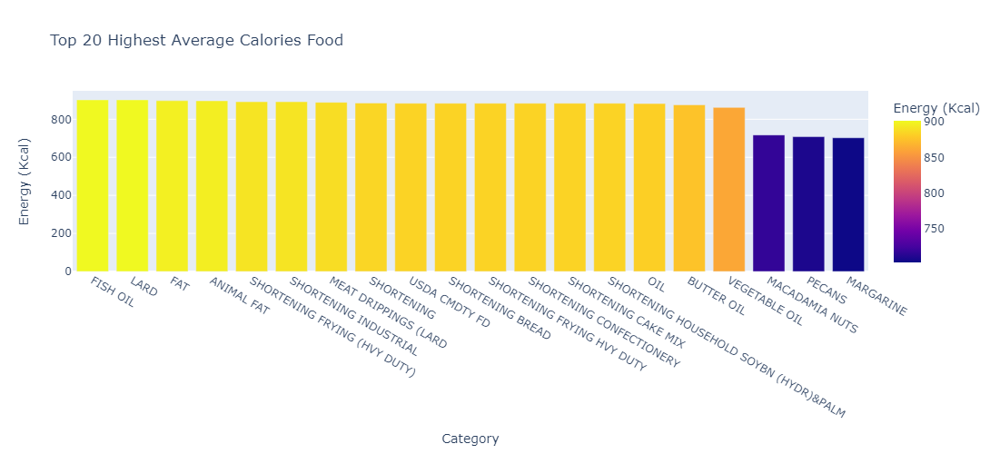

In [26]:
calories_ranking_bar = px.bar(calories_ranking.head(20),x='Category',y='Energy (Kcal)', color='Energy (Kcal)', title='Top 20 Highest Average Calories Food')
calories_ranking_bar.update_layout(
    height = 500)
calories_ranking_bar.show()

##### The visualizations above indicate that fish oil and lard exhibit the highest calorie content, with 902K calory being recorded.

Next, we explore the carbohydrate category with aim to find the top 10 high carb foods
#### 2. Carbohydrates

In [27]:
carb_ranking = macroNutrient_removeRow_ND.groupby(['Category']).mean().sort_values(by=['Carbohydrate(g)'],ascending=False)
carb_ranking

,Energy (Kcal),Carbohydrate(g),Protein(g),Total Lipid(g),Monounsaturated Fatty Acids(g),Polyunsaturated Fatty Acids(g),Saturated Fatty Acids(g)
Category,,,,,,,
SWEETENER,0.0,100.000,0.0000,0.0000,0.0000,0.0000,0.00000
STRAWBERRY-FLAVOR BEV MIX,389.0,99.100,0.1000,0.2000,0.0000,0.0000,0.00000
SUGARS,377.5,97.185,0.0550,0.0500,0.0160,0.0250,0.00900
CHEWING GUM,314.0,95.750,0.0000,0.3500,0.0860,0.1845,0.05000
CORNSTARCH,381.0,91.270,0.2600,0.0500,0.0160,0.0250,0.00900
...,...,...,...,...,...,...,...
ELK,121.5,0.000,24.9725,2.3875,0.9440,0.1570,0.94925
VEG-OIL SPRD,535.0,0.000,0.6000,59.1700,20.3160,24.6860,10.04200
SNAPPER,114.0,0.000,23.4050,1.5300,0.2865,0.5235,0.32500


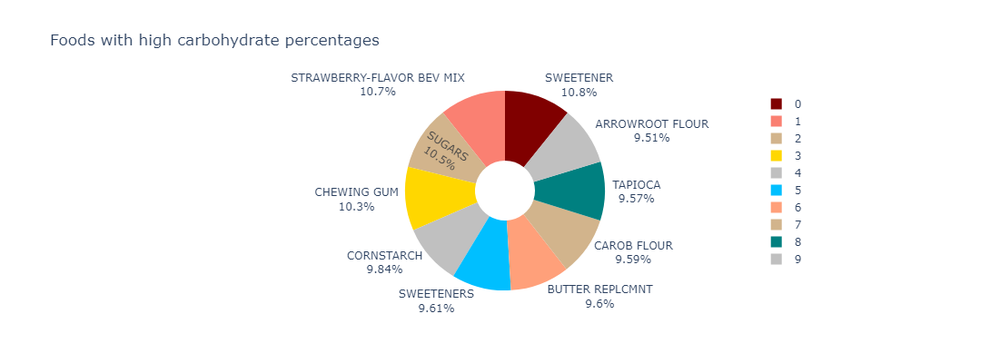

In [28]:
import plotly.graph_objects as go

carb_ranking = macroNutrient_removeRow_ND.groupby(['Category']).mean().sort_values(by=['Carbohydrate(g)'],ascending=False)

carb_ranking=carb_ranking.head(10)
carb_ranking

fig = go.Figure(go.Pie(values=carb_ranking['Carbohydrate(g)'].values, text=carb_ranking.index,
                       marker = {"colors": ["maroon", "salmon", "tan", "gold", "silver","deepskyblue", "lightsalmon", "tan", "teal", "silver"],
                                 "line": {"color": ["wheat", "wheat", "blue", "wheat", "wheat","wheat", "wheat", "blue", "wheat", "wheat"]}}, hole=.3))
fig.update_layout(
    title = { "text": "Foods with high carbohydrate percentages"},
    height = 400
)
fig.show()

##### The pie chart tells us that sweetener and sugar contributed to high carbohydrates.

We further investigate the top 10 food that rich in lipid (fat)
#### 3. Lipid

In [29]:
macroNutrient_removeRow_ND.groupby(['Category']).mean().sort_values(by=['Total Lipid(g)'],ascending=False)


,Energy (Kcal),Carbohydrate(g),Protein(g),Total Lipid(g),Monounsaturated Fatty Acids(g),Polyunsaturated Fatty Acids(g),Saturated Fatty Acids(g)
Category,,,,,,,
SHORTENING HOUSEHOLD SOYBN (HYDR)&PALM,884.0,0.00,0.000,100.0,42.5100,26.6400,25.02
SHORTENING BREAD,884.0,0.00,0.000,100.0,33.0000,40.6000,22.00
VEGETABLE OIL,862.0,0.00,0.000,100.0,11.4000,1.6000,81.50
USDA CMDTY FD,884.0,0.00,0.000,100.0,22.7285,61.2355,11.34
LARD,902.0,0.00,0.000,100.0,45.1000,11.2000,39.20
...,...,...,...,...,...,...,...
FLUID REPLCMNT,10.0,2.45,0.000,0.0,0.0000,0.0000,0.00
SALT,0.0,0.00,0.000,0.0,0.0000,0.0000,0.00
V8 60% VEG JUC,14.0,2.88,0.410,0.0,0.0000,0.0000,0.00


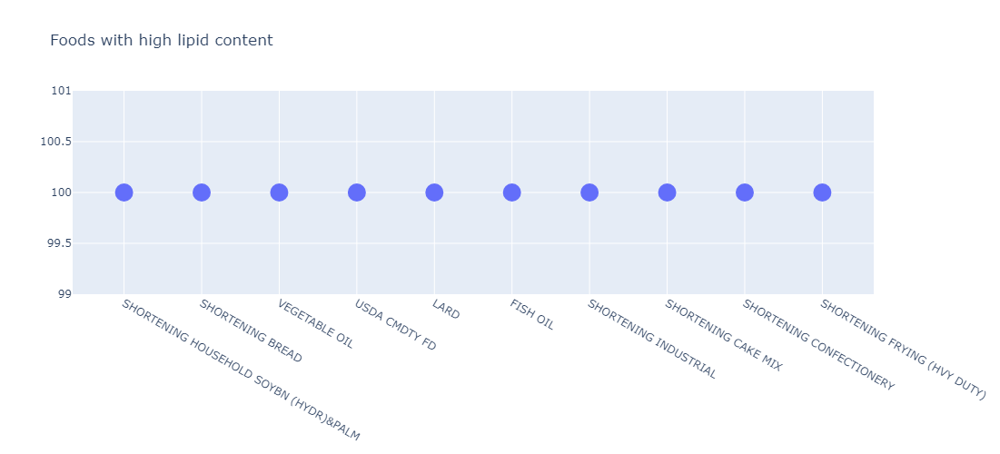

In [30]:
lipid_ranking = macroNutrient_removeRow_ND.groupby(['Category']).mean().sort_values(by=['Total Lipid(g)'],ascending=False)

lipid_ranking=lipid_ranking.head(10)
lipid_ranking

fig = go.Figure(data=[go.Scatter(x=lipid_ranking.index, y=lipid_ranking['Total Lipid(g)'],
                              mode='markers',
              marker_size = 20)])
fig.update_layout(title= "Foods with high lipid content",
                 height = 500)
fig.show()

##### It is advisable to limit the consumption of these foods due to their high lipid content (all with 100g)

#### 4. Protein

In [31]:
protein_ranking = macroNutrient_removeRow_ND.groupby(['Category']).mean().sort_values(by=['Protein(g)'],ascending=False)

In [32]:
protein_ranking = protein_ranking.reset_index()

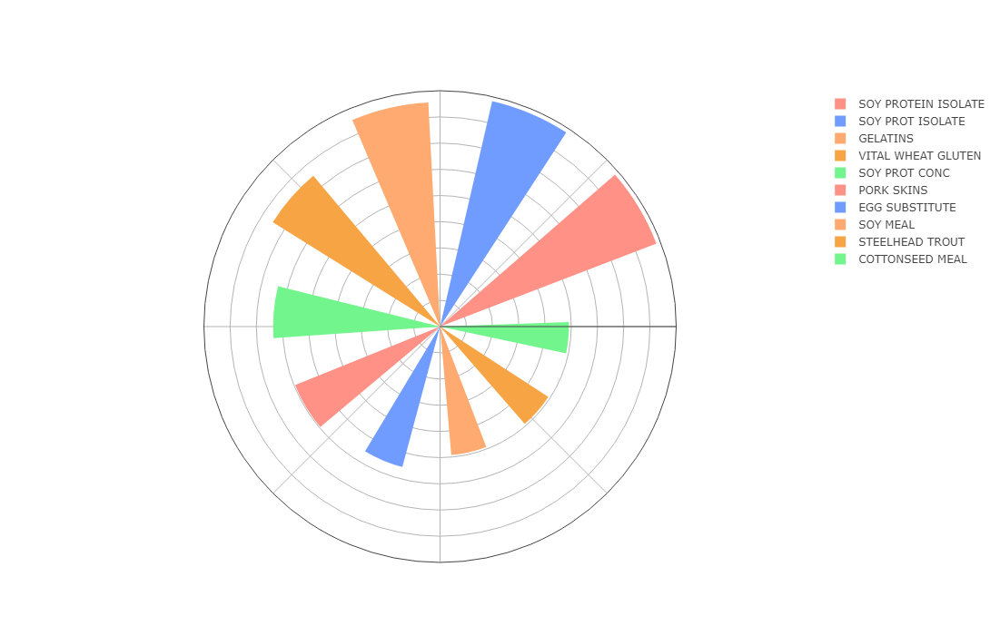

In [33]:

data = protein_ranking['Protein(g)'].head(10)
theta = [31,67,103,139,175,211,247,283,319,355]
width = [20,20,20,18,18,18,16,16,16,14]
name = protein_ranking['Category'].head(10)
marker_color=["#ff9187", '#709BFF', '#FFAA70', '#f7a445', '#73f58d',"#ff9187", '#709BFF', '#FFAA70', '#f7a445', '#73f58d']

barpolar_plots = [go.Barpolar(r=[r], theta=[t], width=[w], name=n, marker_color=[c])
                      for r, t, w, n, c in zip(data, theta, width, name, marker_color)]

fig = go.Figure(barpolar_plots)

fig.update_layout(
    template=None,
    polar = dict(
        radialaxis = dict(range=[0, 90], showticklabels=False, ticks=''),
        angularaxis = dict(showticklabels=False, ticks='')
    ),
    height = 700
)

fig.show()

The plotting tell that soys, gelatins, wheat, egg and pork skin are the highest protein food, therefore those food can be recommend to the people who are in gym and keeping fit.

#### 5. Proportion of macronutrient in food
A 3D bubble plot to display the relationship of food carb, food protein and lipid

In [34]:
import chart_studio.plotly as py
import plotly.figure_factory as ff

macroNutrient_removeRow_N = macroNutrient_removeRow.drop(macroNutrient_removeRow[['No.']],axis=1)
nutrients = macroNutrient_removeRow_N
nutrients

fig = go.Figure(data=go.Scatter3d(
    x=nutrients['Carbohydrate(g)'].values,
    y=nutrients['Protein(g)'].values,
    z=nutrients['Total Lipid(g)'].values,
    text=nutrients['Description'].values,
    mode='markers',
    marker=dict(
        sizemode='diameter',
        sizeref=650,
        color = nutrients['Energy (Kcal)'].values,
        colorscale = 'Portland',
        colorbar = dict(title = 'Energy (Kcal)'),
        line=dict(color='rgb(255, 255, 255)')
        ))
)
fig.update_layout(height=800, 
                  width=800, 
                  title='3D Scatter Plot of Foods',
                  scene = dict(
                    xaxis_title='Carbohydrate(g)',
                    yaxis_title='Protein(g)',
                    zaxis_title='Total Lipid(g)'),
                 )
fig.show()

##### Each of the food seems to be having a balanced nutrition content in term of weight where the total of 3 nutrients will not exceed 100g. There is no such thing as a food that has high carb, lipid and protein in a same time. The scatter plot fully obey the theory of energy equilibrium.

In [35]:
# fig = px.sunburst(macroNutrient_removeRow_N, path = ['Category', 'Description'], width = 900, color_discrete_sequence=px.colors.cyclical.Edge)
# fig.show()